Import

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision.transforms import transforms
import os

In [2]:
!pip install kaggle

In [3]:
import json
import os
kaggle_dictionary=json.load(open('kaggle.json'))
os.environ['KAGGLE_USERNAME']=kaggle_dictionary['username']
os.environ['KAGGLE_KEY']=kaggle_dictionary['key']

In [4]:
!kaggle datasets download badasstechie/celebahq-resized-256x256

Dataset URL: https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256
License(s): GPL-2.0
 79% 225M/283M [00:00<00:00, 499MB/s] 
100% 283M/283M [00:04<00:00, 70.4MB/s]


In [5]:
from zipfile import ZipFile
with ZipFile('/content/celebahq-resized-256x256.zip','r') as zip:
    zip.extractall()

In [6]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Parameters

In [7]:
image_size=64
batch_size=64
epochs=100
learning_rate=0.0002
latent_dim=100
n_critic=5
clip_value=0.01

Dataset

In [8]:

transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [9]:
!mkdir /content/celeba_hq_256/all_images
!mv /content/celeba_hq_256/*.jpg /content/celeba_hq_256/all_images/
!mv /content/celeba_hq_256/*.png /content/celeba_hq_256/all_images/

mv: cannot stat '/content/celeba_hq_256/*.png': No such file or directory


In [10]:
train_data=datasets.ImageFolder(root="/content/celeba_hq_256",transform=transform)

In [11]:
train_loader=DataLoader(train_data,batch_size=batch_size,shuffle=True,pin_memory=True)

In [12]:
train_loader

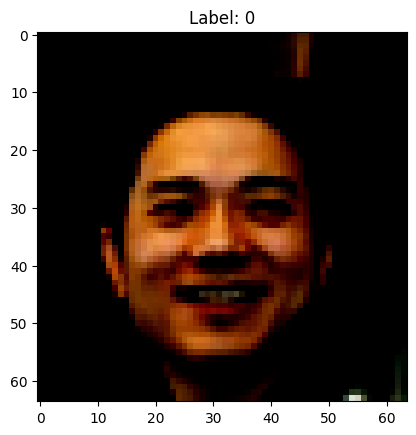

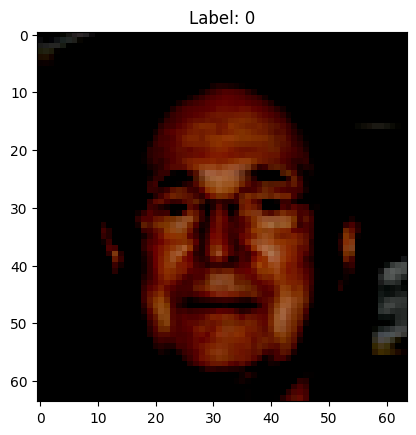

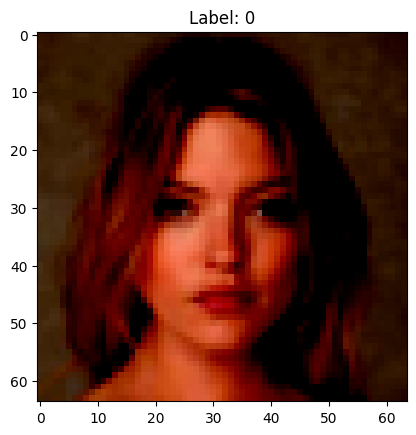

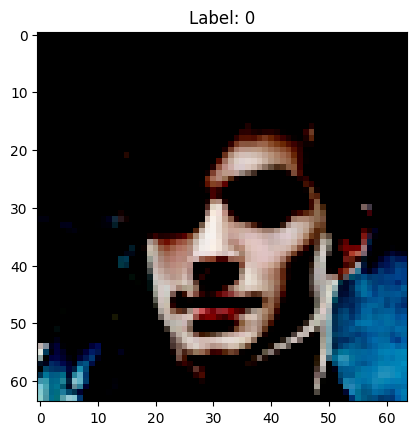

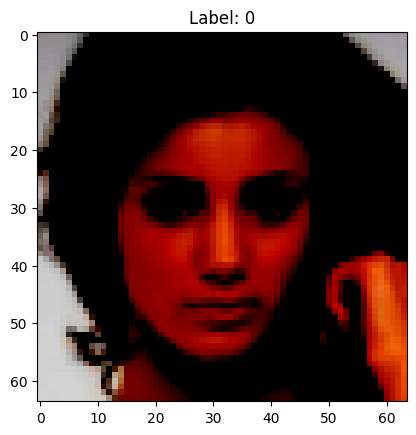

In [13]:
import matplotlib.pyplot as plt

for i in range(5):
    image, label = train_data[i]
    plt.imshow(image.permute(1, 2, 0))
    plt.title(f"Label: {label}")
    plt.show()

In [14]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [15]:
class Critic(nn.Module):
  def __init__(self,features):
    super().__init__()
    self.disc=nn.Sequential(
        nn.Conv2d(3,64,4,2,1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(64,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(128,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(256,512,4,2,1,bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(512,1,4,1,0,bias=False),
    )
  def forward(self,x):
    return self.disc(x).view(-1)

In [16]:
class Generator(nn.Module):
  def __init__(self,latent_dim,img_dim):
    super().__init__()
    self.gen=nn.Sequential(
        nn.ConvTranspose2d(latent_dim,512,4,1,0,bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(),

        nn.ConvTranspose2d(512,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(),

        nn.ConvTranspose2d(256,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(),

        nn.ConvTranspose2d(128,64,4,2,1,bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(),

        nn.ConvTranspose2d(64,3,4,2,1,bias=False),
        nn.Tanh()
    )
  def forward(self,x):
    return self.gen(x)

In [17]:
generator=Generator(latent_dim,image_size).to(device)
generator.apply(weights_init)
print(generator)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [18]:
discriminator=Critic(image_size).to(device)
discriminator.apply(weights_init)
print(discriminator)

Critic(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [19]:

optim_gen=optim.RMSprop(generator.parameters(),lr=learning_rate)
optim_critic=optim.RMSprop(discriminator.parameters(),lr=learning_rate)

In [20]:
noise=torch.randn(batch_size,latent_dim,1,1).to(device)

In [21]:
fixed_noise = torch.randn(batch_size, latent_dim,1,1).to(device)

Training Loop

In [22]:
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

In [23]:
len(train_loader)

469

In [24]:
%load_ext tensorboard

In [25]:
%tensorboard --logdir runs/


<IPython.core.display.Javascript object>

In [26]:
writer = SummaryWriter()
for epoch in range(epochs):
  total_loss_d = 0.0
  total_loss_g = 0.0
  num_batches = len(train_loader)
  for batch,(real_img,_) in enumerate(train_loader):
    real_img=real_img.to(device)
    batch_size=real_img.shape[0]

    real_labels=torch.ones((batch_size,1)).to(device)* 0.9
    fake_labels=torch.zeros((batch_size,1)).to(device)

    #Training Critic
    noise=torch.randn(batch_size,latent_dim,1,1).to(device)
    fake_img=generator(noise)
    critic_real=discriminator(real_img)

    critic_fake=discriminator(fake_img.detach())

    loss_critic=-(torch.mean(critic_real)-torch.mean(critic_fake))
    discriminator.zero_grad()
    loss_critic.backward()
    optim_critic.step()

    for p in discriminator.parameters():
      p.data.clamp_(-clip_value, clip_value)

    total_loss_d += loss_critic.item()
    if batch%n_critic==0:
    #Training generator
      noise = torch.randn(batch_size, latent_dim, 1, 1).to(device)
      fake_img = generator(noise)
      output=discriminator(fake_img)
      loss_gen=-torch.mean(output)
      generator.zero_grad()
      loss_gen.backward()
      optim_gen.step()
      total_loss_g += loss_gen.item()
  avg_loss_d = total_loss_d / num_batches
  avg_loss_g = total_loss_g / num_batches
  print(f"Epoch [{epoch+1}/{epochs}]  Loss_D: {avg_loss_d:.4f}  Loss_G: {avg_loss_g:.4f}")
  writer.add_scalar('Loss/Discriminator', avg_loss_d, epoch)
  writer.add_scalar('Loss/Generator', avg_loss_g, epoch)
  with torch.no_grad():
    samples = generator(fixed_noise)
    grid = make_grid(samples, nrow=8, normalize=True)
    writer.add_image('Generated Images', grid, epoch)
writer.close()

Epoch [1/100]  Loss_D: -0.6045  Loss_G: 0.0760
Epoch [2/100]  Loss_D: -0.9985  Loss_G: 0.1162
Epoch [3/100]  Loss_D: -0.9544  Loss_G: 0.1133
Epoch [4/100]  Loss_D: -0.9041  Loss_G: 0.1099
Epoch [5/100]  Loss_D: -0.8536  Loss_G: 0.1038
Epoch [6/100]  Loss_D: -0.8096  Loss_G: 0.0996
Epoch [7/100]  Loss_D: -0.7615  Loss_G: 0.0866
Epoch [8/100]  Loss_D: -0.7122  Loss_G: 0.0773
Epoch [9/100]  Loss_D: -0.6737  Loss_G: 0.0768
Epoch [10/100]  Loss_D: -0.6377  Loss_G: 0.0638
Epoch [11/100]  Loss_D: -0.5986  Loss_G: 0.0622
Epoch [12/100]  Loss_D: -0.5734  Loss_G: 0.0583
Epoch [13/100]  Loss_D: -0.5523  Loss_G: 0.0533
Epoch [14/100]  Loss_D: -0.5270  Loss_G: 0.0509
Epoch [15/100]  Loss_D: -0.5107  Loss_G: 0.0464
Epoch [16/100]  Loss_D: -0.4963  Loss_G: 0.0445
Epoch [17/100]  Loss_D: -0.4742  Loss_G: 0.0444
Epoch [18/100]  Loss_D: -0.4612  Loss_G: 0.0409
Epoch [19/100]  Loss_D: -0.4483  Loss_G: 0.0388
Epoch [20/100]  Loss_D: -0.4379  Loss_G: 0.0364
Epoch [21/100]  Loss_D: -0.4223  Loss_G: 0.0336
E

KeyboardInterrupt: 

In [ ]:
rm -r runs